---
title: "Lab-2.1: Assignment"
author: Brian Kwon
format: 
  html: 
    embed-resources: true
---

`Gathering text data with an API`

**IMPORTANT:** The lab shown here (on the website) is just an HTML version, included for reference. To download the assignment, please navigate to the Labs tab in the Share-point dropdown menu in the website’s navigation bar. The relevant assignment can be determined from the folder’s name, click on the three dots & select download to get the assignment.

**NOTE**: It is recommended that you complete this `.ipynb` file in VS-code. 

`Submission:`

* Export the completed assignment to HTML or PDF (preferably with Quarto) and upload it to Canvas.
* The final uploaded version should NOT have any code-errors present
* All outputs must be visible in the uploaded version, including code-cell outputs, images, graphs, etc

In [1]:
import requests
import json
import wikipedia
import re
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt


## Assignment-1: 

* Read over the `News-API`, `Wikipedia API`, and `Google Scholar` API sections in the lab-demonstration section, if you have not done so already. 
  * [https://jfh.georgetown.domains/dsan5000/](https://jfh.georgetown.domains/dsan5000/)
* Get an API key for the `News-API`: [see following link](https://newsapi.org/docs/get-started)
* **Submission**: Insert your API key below 

In [2]:
API_KEY='5ea98ef3b2a34771b5694c4ab7bebb0d'

## Assignment-2: 

* Use the provided `News-API` code as a starting point 
* Select `THREE` random topics (e.g. Georgetown, Cats, Clouds) but choose whatever you like 
* Query the API to pull text data and store the results in three different dictionaries 
* Extract the `title` and `description` text and store for later processing (up to you how you do this)
* Clean the text as needed 

In [3]:
baseURL = "https://newsapi.org/v2/everything?"

TOPIC1 = "Immigration"
URLpost = {'apiKey': API_KEY,
            'q': '+'+TOPIC1,
            'sortBy': 'relevancy',
            'totalRequests': 1}
response1 = requests.get(baseURL, URLpost)
response1 = response1.json()

TOPIC2 = "Education"
URLpost = {'apiKey': API_KEY,
            'q': '+'+TOPIC2,
            'sortBy': 'relevancy',
            'totalRequests': 1}
response2 = requests.get(baseURL, URLpost)
response2 = response2.json()

TOPIC3 = "Salary"
URLpost = {'apiKey': API_KEY,
            'q': '+'+TOPIC3,
            'sortBy': 'relevancy',
            'totalRequests': 1}
response3 = requests.get(baseURL, URLpost)
response3 = response3.json()

In [4]:
def string_cleaner(input_string):
    try: 
        out=re.sub(r"""
                    [,.;@#?!&$-]+  # Accept one or more copies of punctuation
                    \ *           # plus zero or more copies of a space,
                    """,
                    " ",          # and replace it with a single space
                    input_string, flags=re.VERBOSE)

        #REPLACE SELECT CHARACTERS WITH NOTHING
        out = re.sub('[’.]+', '', input_string)

        #ELIMINATE DUPLICATE WHITESPACES USING WILDCARDS
        out = re.sub(r'\s+', ' ', out)

        #CONVERT TO LOWER CASE
        out=out.lower()
    except:
        print("ERROR")
        out=''
    return out

In [5]:
article_list1 = response1["articles"]
article_keys1=article_list1[0].keys()
cleaned_data1=[]
for article in article_list1:
    tmp = []
    for key in article_keys1:
        if key == "title":
            tmp.append(string_cleaner(article[key]))
        if key == "description":
            tmp.append(string_cleaner(article[key]))
    cleaned_data1.append(tmp)
    
article_list2 = response2["articles"]
article_keys2=article_list2[0].keys()
cleaned_data2=[]
for article in article_list2:
    tmp = []
    for key in article_keys2:
        if key == "title":
            tmp.append(string_cleaner(article[key]))
        if key == "description":
            tmp.append(string_cleaner(article[key]))
    cleaned_data2.append(tmp)

article_list3 = response3["articles"]
article_keys3=article_list3[0].keys()
cleaned_data3=[]
for article in article_list3:
    tmp = []
    for key in article_keys3:
        if key == "title":
            tmp.append(string_cleaner(article[key]))
        if key == "description":
            tmp.append(string_cleaner(article[key]))
    cleaned_data3.append(tmp)

ERROR


## Assignment-3: 

* Use the provided `Wikipedia-API` code as a starting point 
* For EACH `THREE` of the random topics, create a word cloud for your cleaned  `title` and `description` text 

In [6]:
def generate_word_cloud(my_text):
    # exit()
    # Import package
    # Define a function to plot word cloud
    def plot_cloud(wordcloud):
        # Set figure size
        plt.figure(figsize=(40, 30))
        # Display image
        plt.imshow(wordcloud) 
        # No axis details
        plt.axis("off");

    # Generate word cloud
    wordcloud = WordCloud(
        width = 3000,
        height = 2000, 
        random_state=1, 
        background_color='salmon', 
        colormap='Pastel1', 
        collocations=False,
        stopwords = STOPWORDS).generate(my_text)
    plot_cloud(wordcloud)
    plt.show()

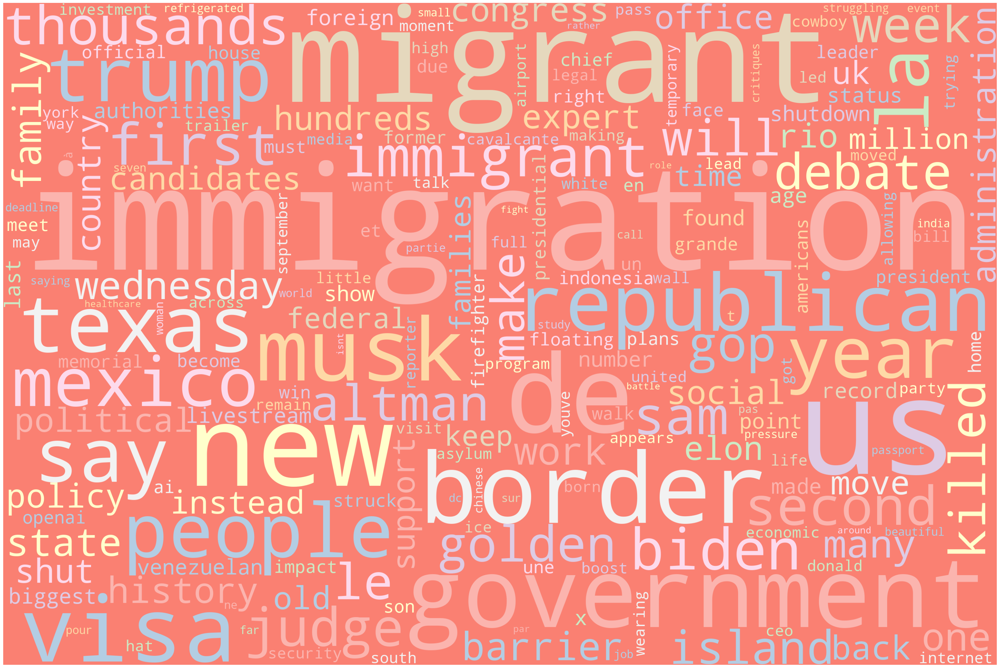

In [7]:
text = ''
for i in cleaned_data1:
    title = i[0]
    description = i[1]
    text = text + title + description
generate_word_cloud(string_cleaner(text))

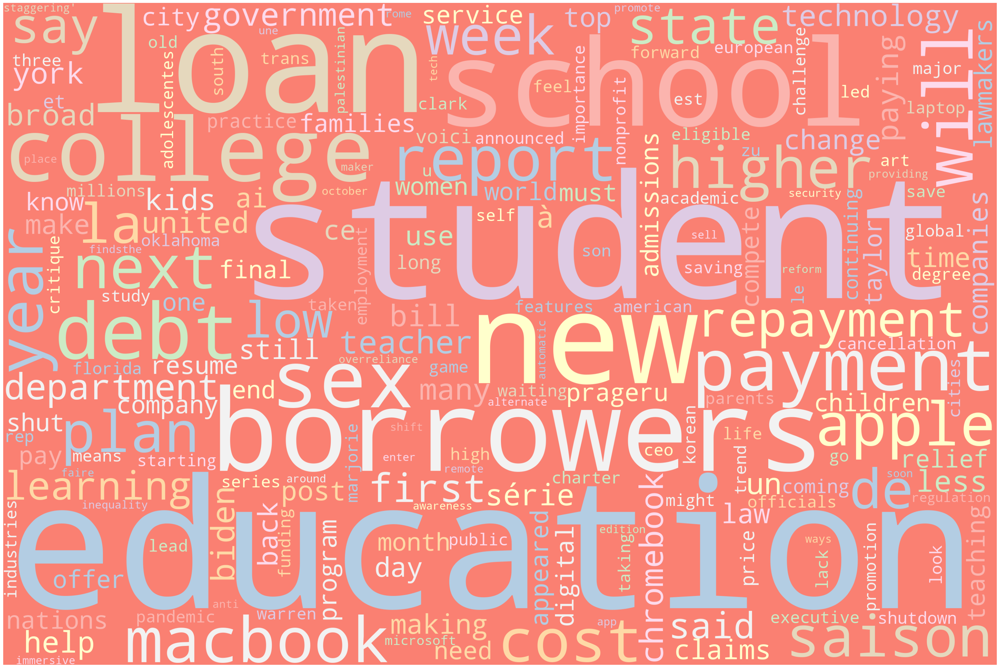

In [8]:
text = ''
for i in cleaned_data2:
    title = i[0]
    description = i[1]
    text = text + title + description
generate_word_cloud(string_cleaner(text))

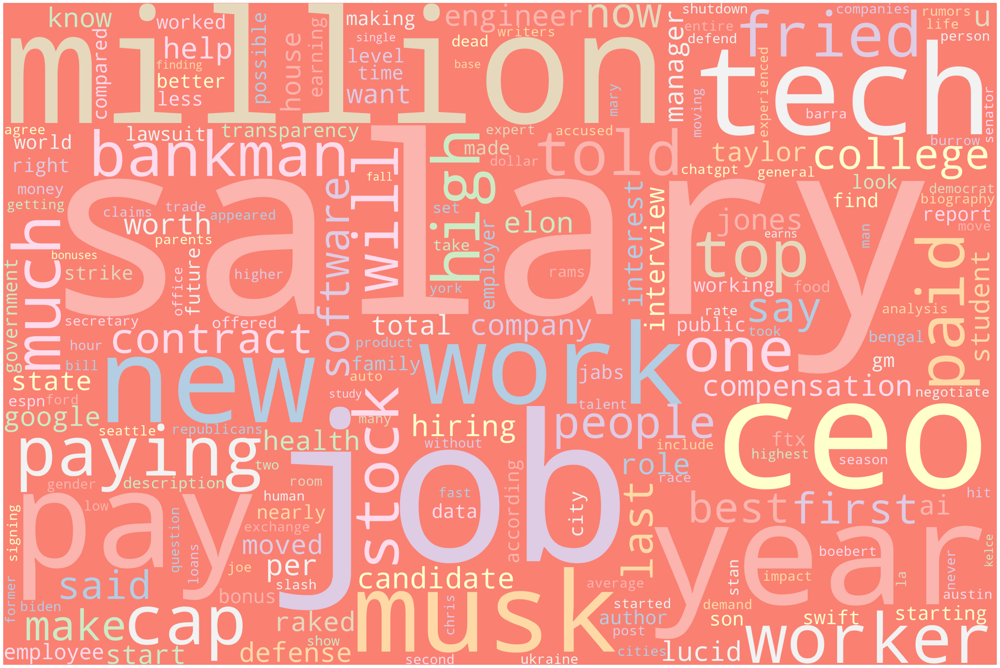

In [9]:
text = ''
for i in cleaned_data3:
    title = i[0]
    description = i[1]
    text = text + title + description
generate_word_cloud(string_cleaner(text))

World clouds from Wikipedia API

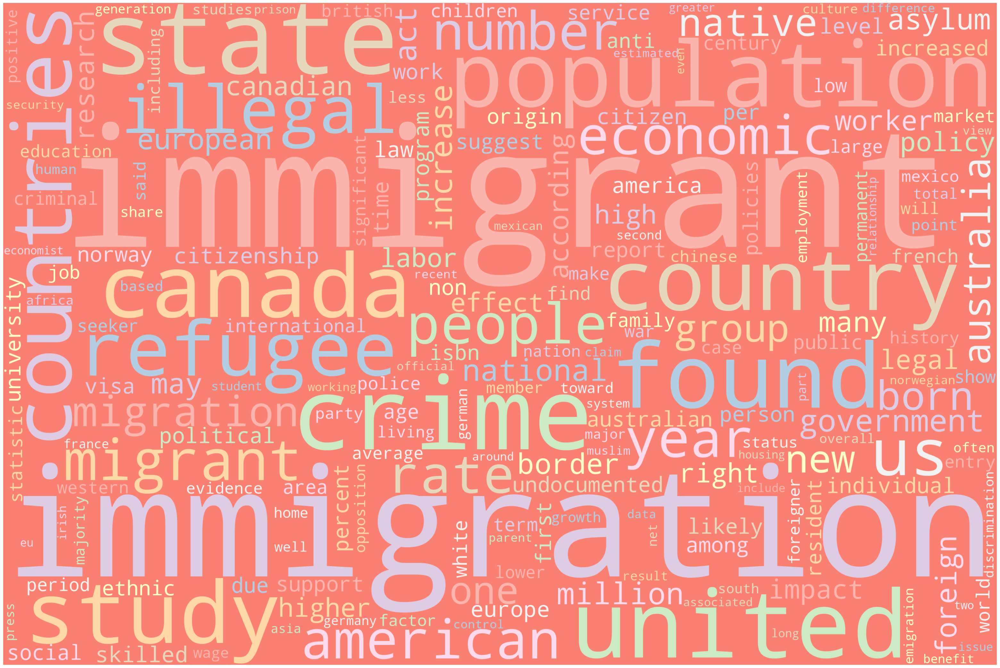

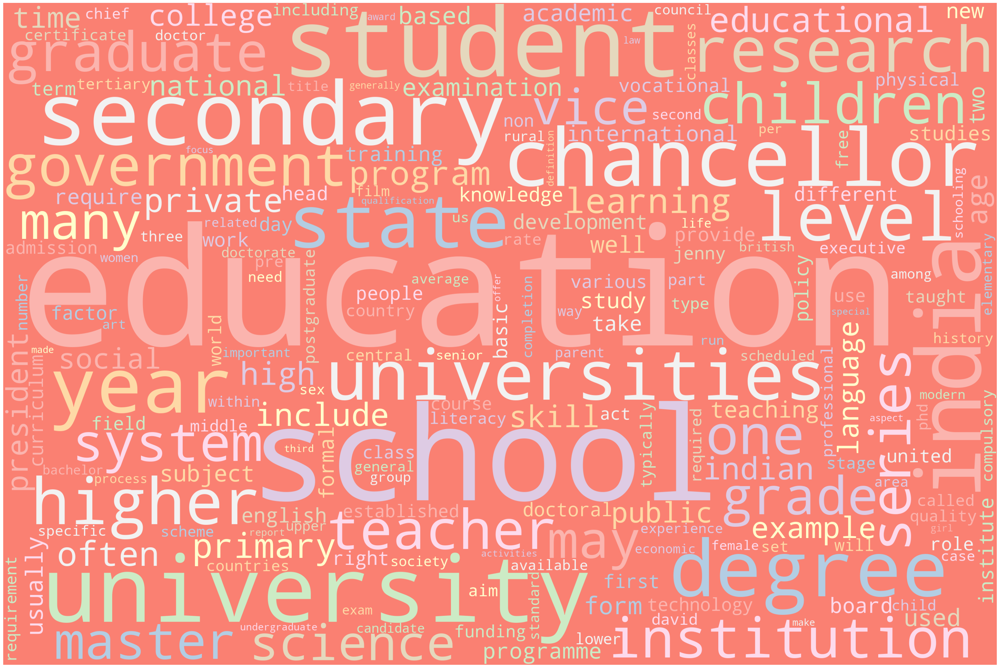

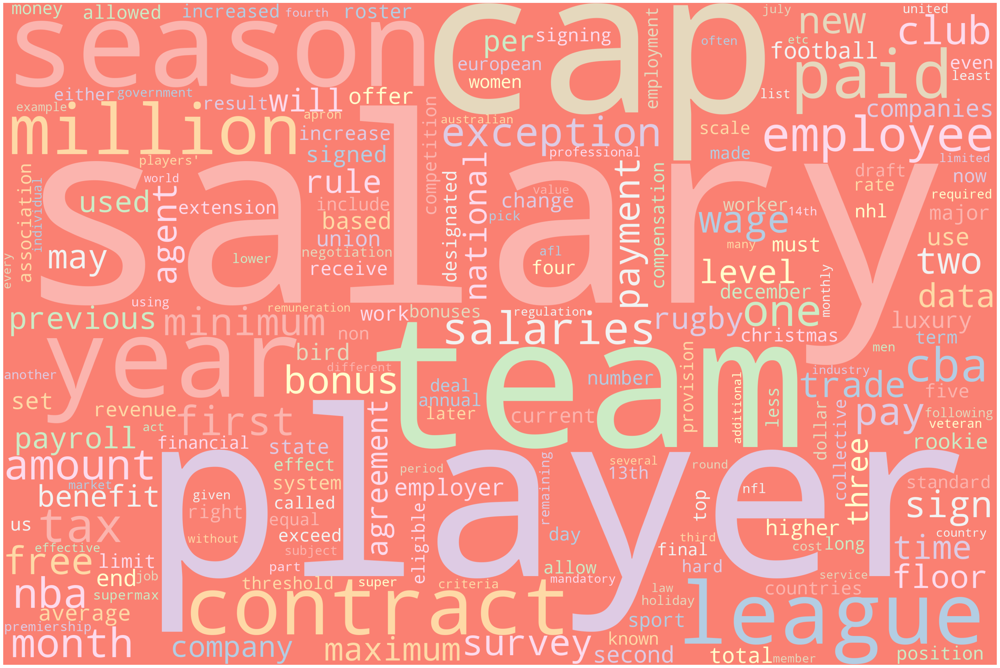

In [10]:
topic_list = ["immigration","education","salary"]
for topic in topic_list:
    text = ''
    max_num = 10
    titles = wikipedia.search(topic,results=max_num)
    for title in titles:
        page = wikipedia.page(title, auto_suggest=False)
        text = text + page.content
    generate_word_cloud(string_cleaner(text))
